### EV353 Oceanography and Climate In-class Data Analysis Activity

**Global Wind Stress Fields**

The cross-calibrated multi-platform (CCMP) Ocean Surface Winds product is a blend of satellite products and in-situ observations of near-surface (10m) wind speeds over the ocean. We will use this dataset to investigate ocean-atmosphere interactions.

The dataset `ccmp.nc` is needed for this activity.  

----
**1. Open and display the zonal and meridional wind components using xarray (sample code provided below for you to modify)**

```
# open dataset using xarray (ccmp.nc)
filePath = 'paste your filepath here'
ds = xr.open_dataset(filePath)

# display dataset
ds
```

**2. Use the wind components, calculate and produce global maps of the time-averaged meridional wind stress $\tau_y$ and zonal wind stress $\tau_x$.**

Revisit the ocean's momentum budget for the equations to calculate wind stress from meridional wind speed $v_a$ and zonal wind speed $u_a$. Assume the surface air density $\rho_a$ = 1.2 $kg/m^3$ and the drag coefficient $C_d$ = 0.0013. Take care to retain the sign of $\tau_y$ and $\tau_u$.

**3. Once you generate your map, interpret the results!**
Select a tropical region and identify the latitude of the ITCZ at that longitude using a criterion developed based on $\tau$.

**4. Test your criterion by generating maps to show the seasonal cycle in $\tau_y$.** 
- How does the ITCZ latitude vary as a function of season? 
- Are there any regions or longitude ranges where such an objective criterion struggles to identify the latitude of the ITCZ? How do?

Add your observations in a Markdown cell and discuss them with your classmates.

In [1]:
# import Python packages
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
# open dataset using xarray (ccmp.nc)
filePath = '/Users/a_rust/Documents/EV353_Oceanography/ccmp.nc'
ds = xr.open_dataset(filePath)

# display dataset
ds

<xarray.Dataset>
Dimensions:  (month: 12, lat: 628, lon: 1440)
Coordinates:
  * month    (month) float64 1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0 11.0 12.0
  * lat      (lat) float32 -78.38 -78.12 -77.88 -77.62 ... 77.88 78.12 78.38
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
Data variables:
    uwnd     (month, lat, lon) float32 ...
    vwnd     (month, lat, lon) float32 ...
    wspd     (month, lat, lon) float32 ...
Attributes:
    description:  ccmp

In [3]:
ua = ds['uwnd'].mean(dim='month')
va = ds['vwnd'].mean(dim='month')

density = 1.2
Cd = 0.0013

Tx = (density * Cd * (ua * abs(ua)))
Ty = (density * Cd * (va * abs(va)))

In [4]:
Ty.max()

<xarray.DataArray 'vwnd' ()>
array(0.10125998, dtype=float32)

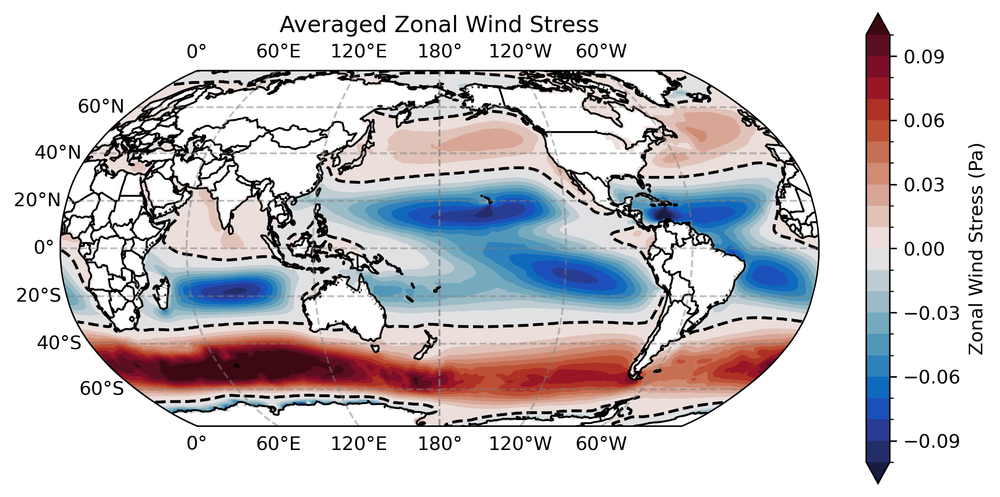

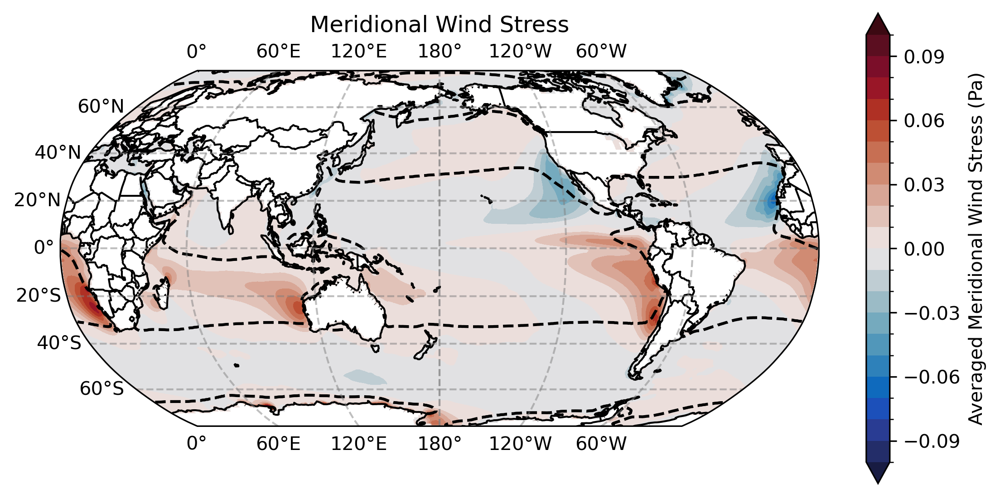

In [5]:
# map projection
proj = ccrs.Robinson(central_longitude=180)
cmap = cmocean.cm.balance
lev = np.arange(-.1, 0.11, 0.01)

fig = plt.figure(figsize=(9, 4.5), dpi=300)
ax = plt.axes(projection = proj)

# 
Tx.plot.contourf(
    x='lon',
    y='lat',
    ax=ax,
    transform=ccrs.PlateCarree(),
    levels=lev,
    extend='both',
    cmap=cmap,
    cbar_kwargs={'label': "Zonal Wind Stress (Pa)"}
    
 
)

Tx.plot.contour(ax=ax, levels=[-0.00001], cmap="Black", add_labels=False, transform=ccrs.PlateCarree())
# add coastlines
ax.add_feature(cfeature.BORDERS, linestyle ='None')
ax.coastlines(resolution='110m') 
ax.gridlines(crs = ccrs.PlateCarree(),
             draw_labels = True,
             linewidth = 1,
             color = 'gray',
             alpha = 0.5,
             linestyle = '--')

# add title
ax.set_title("Averaged Zonal Wind Stress")
fig.savefig('Zonal Wind Stress.png', facecolor = 'white', transparent = False, bbox_inches ='tight')

# map projection
proj = ccrs.Robinson(central_longitude=180)
cmap = cmocean.cm.balance
lev = np.arange(-.1, 0.11, 0.01)

fig = plt.figure(figsize=(9, 4.5), dpi=300)
ax = plt.axes(projection = proj)

# 
Ty.plot.contourf(
    x='lon',
    y='lat',
    ax=ax,
    transform=ccrs.PlateCarree(),
    levels=lev,
    extend='both',
    cmap=cmap,
    cbar_kwargs={'label': "Averaged Meridional Wind Stress (Pa)"}
    
 
)
Tx.plot.contour(ax=ax, levels=[-0.00001], cmap="Black", add_labels=False, transform=ccrs.PlateCarree())
# add coastlines
ax.add_feature(cfeature.BORDERS, linestyle ='None')
ax.coastlines(resolution='110m')

ax.gridlines(crs = ccrs.PlateCarree(),
             draw_labels = True,
             linewidth = 1,
             color = 'gray',
             alpha = 0.5,
             linestyle = '--')

# add title
ax.set_title("Meridional Wind Stress")
fig.savefig('Meridional Wind Stresst.png', facecolor = 'white', transparent = False, bbox_inches ='tight')




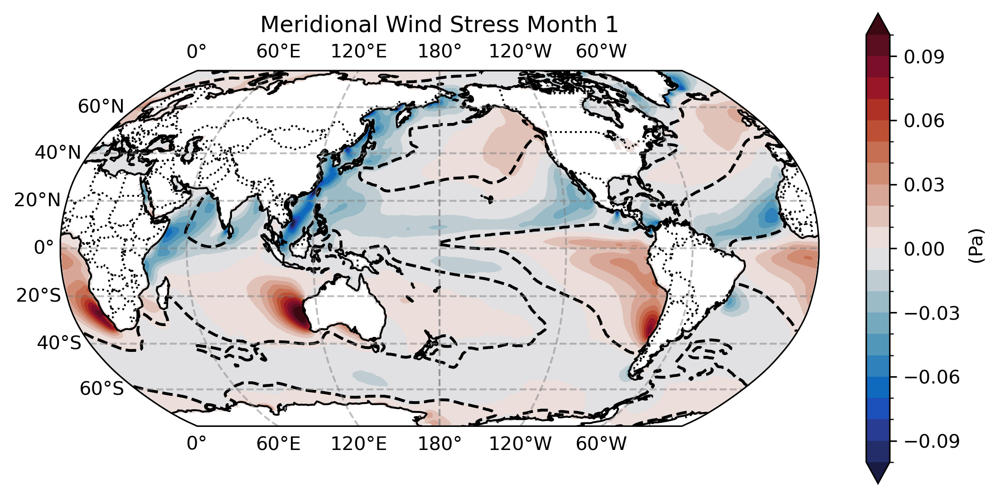

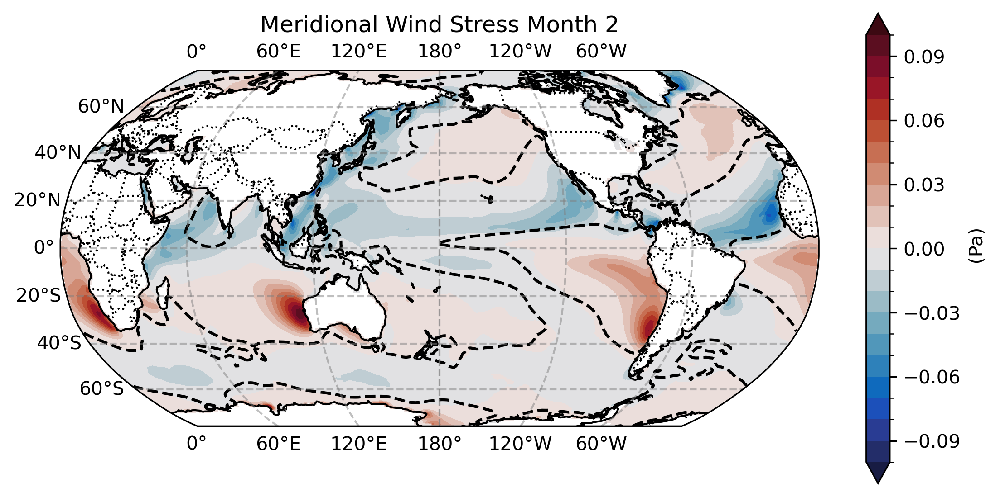

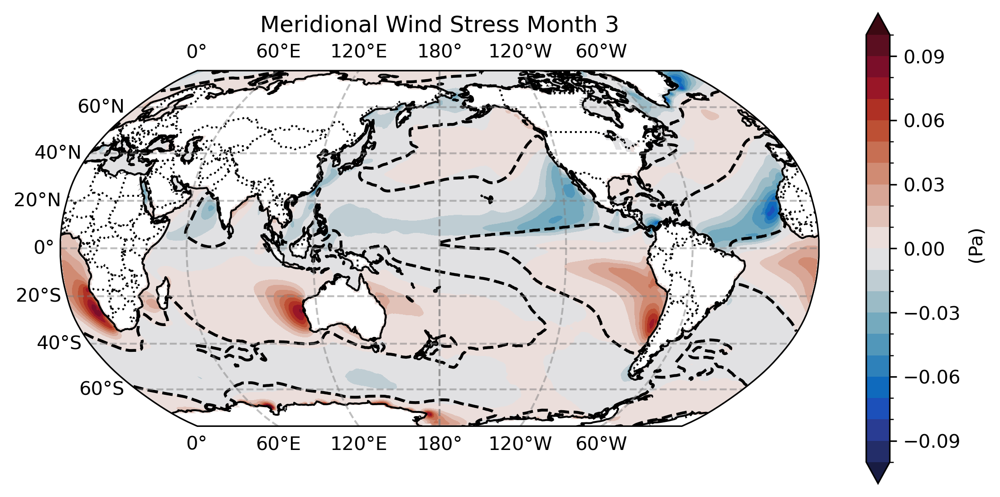

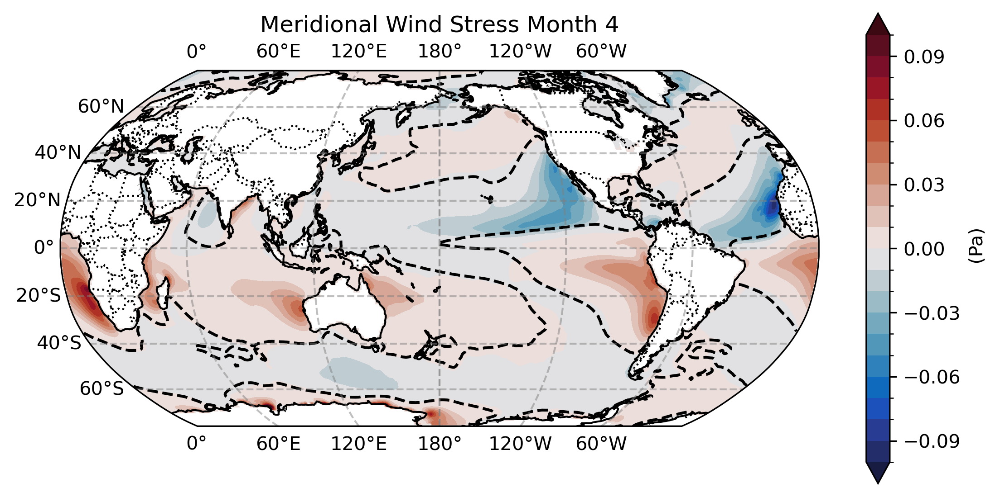

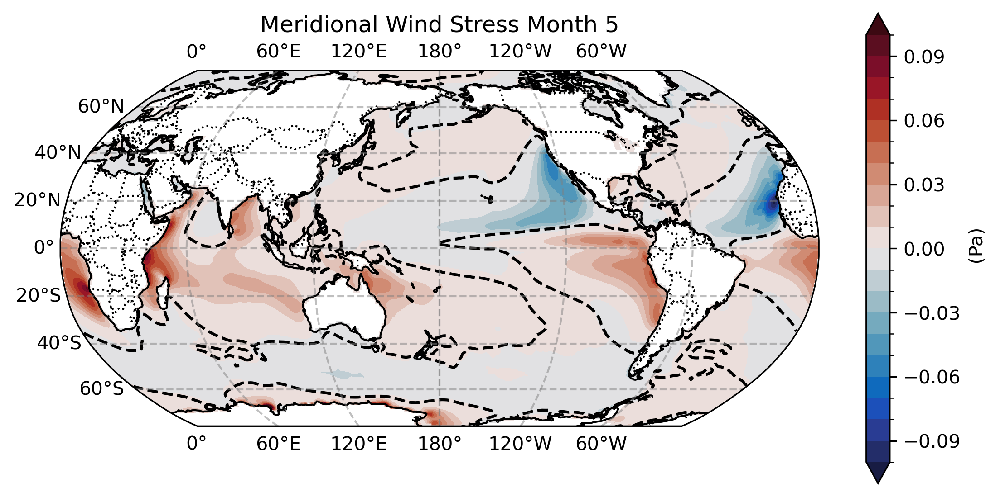

...

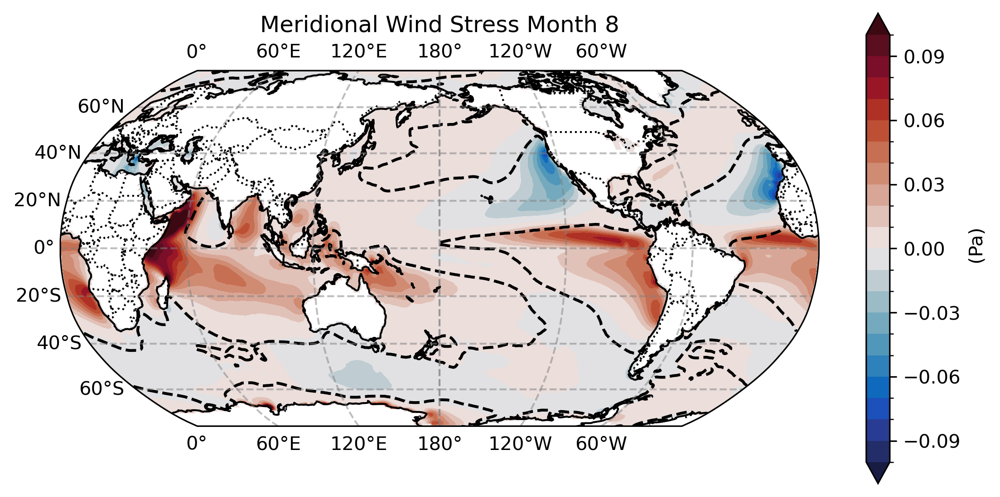

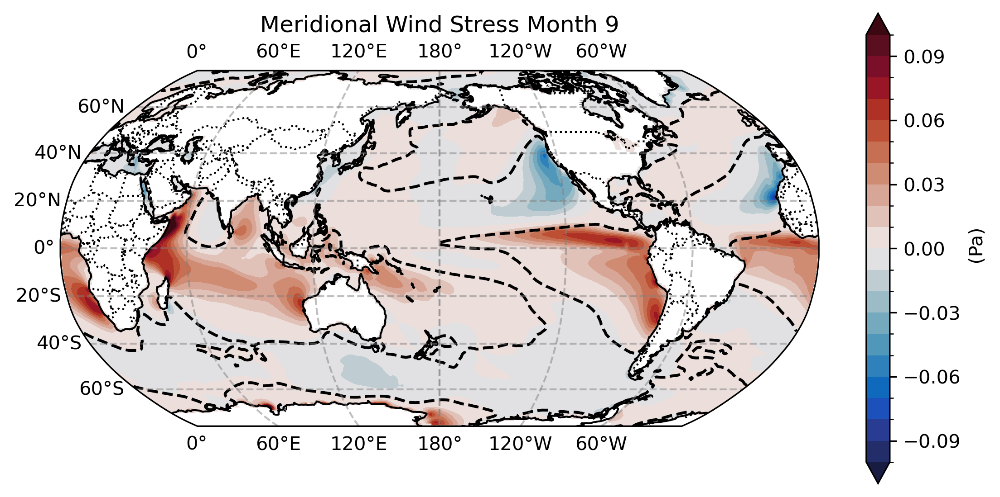

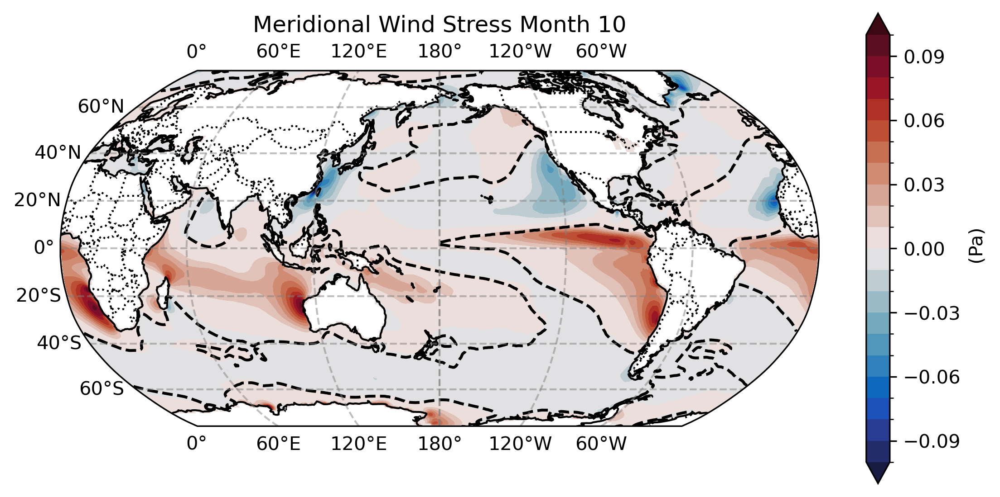

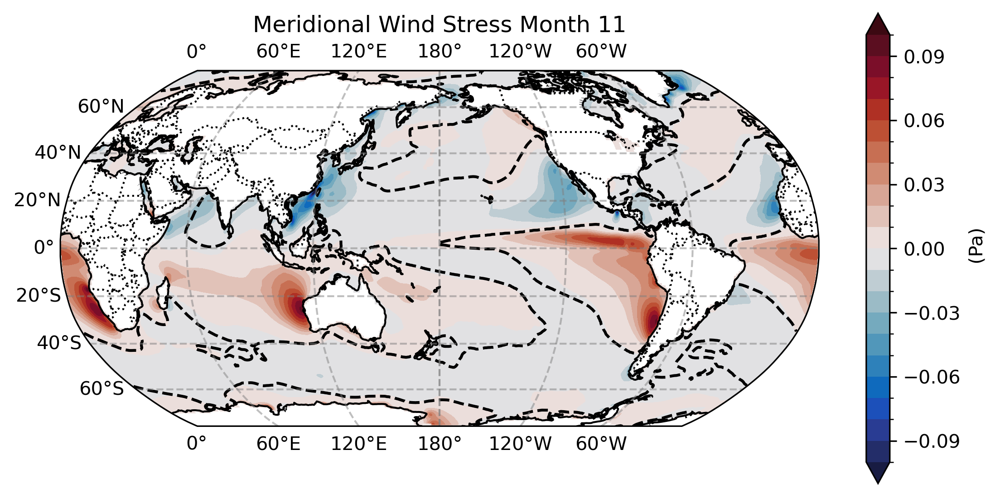

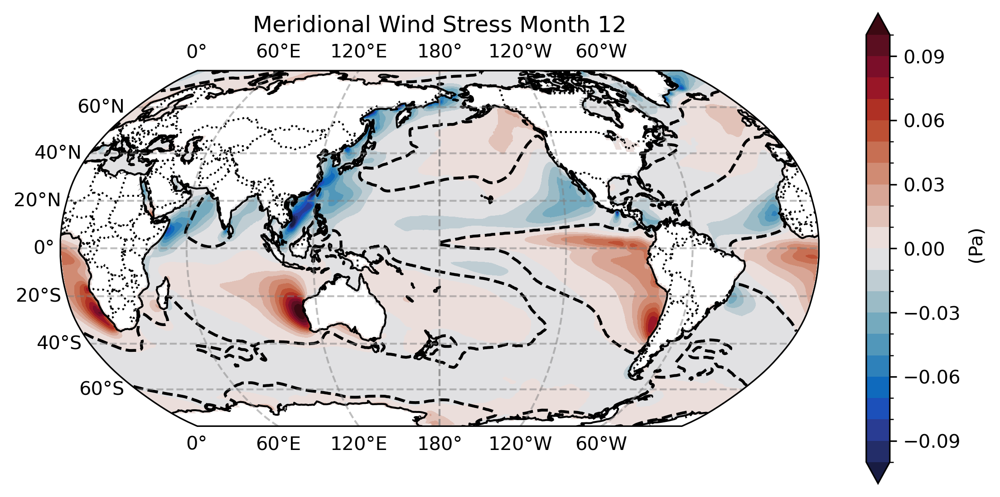

In [7]:
#Meridional
va = ds['vwnd']
Ty_seasonal = (density * Cd * (va * abs(va)))

proj = ccrs.Robinson(central_longitude=180)
cmap = cmocean.cm.balance
lev = np.arange(-.1, 0.11, 0.01)

#DR
for i in range(12):
    fig = plt.figure(figsize=(9, 4.5), dpi=300)
    ax = plt.axes(projection=proj)

    Ty_seasonal.isel(month=i).plot.contourf(
        x='lon',
        y='lat',
        ax=ax,
        transform=ccrs.PlateCarree(),
        levels=lev,
        cmap=cmap,
        extend='both',
        cbar_kwargs={'label': ' (Pa)'}
    )
    
    Ty.plot.contour(ax=ax, levels=[-0.00001], cmap="Black", add_labels=False, transform=ccrs.PlateCarree())

    ax.coastlines(resolution='110m')
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.gridlines(crs = ccrs.PlateCarree(),
             draw_labels = True,
             linewidth = 1,
             color = 'gray',
             alpha = 0.5,
             linestyle = '--')
    
    ax.set_title(f'Meridional Wind Stress Month {i + 1}')
    fig.savefig(f'monthld_meridional_windstress_{i + 1}.png', bbox_inches='tight', facecolor='white')


3. Once you generate your map, interpret the results! Select a tropical region and identify the latitude of the ITCZ at that longitude using a criterion developed based on Tao.

I am selecting the eastern Pacific (West Coast of Central America) as my tropical region and by using Tao as an indicator of ITCZ placement it appears that the ITCZ is slightly North of the equator at ~10 Degrees North because this is where Ty (Meridional Component) is zero. In other words, this is where the vertical wind (Va) component converges which represents the two Hadley cells converging which is what the ITCZ is.

5. Test your criterion by generating maps to show the seasonal cycle in Ty.

How does the ITCZ latitude vary as a function of season?
The ITCZ shifts as a function of seasons with a northern shift during boreal summer and a southern shift during boreal winter.

Are there any regions or longitude ranges where such an objective criterion struggles to identify the latitude of the ITCZ? How do?